**Titanic Case - Machine Learning from Disaster**

In this research about the Titanic disaster case. I'm trying to explore this dataset by pouring in graphical analysis, and engineering to cultivate machine learning. I tried models such as Logistic Regression, K-Nearest Neighbors, Support Vector Classifier, Naive Bayes, Decision Tree, and Random Forests to formulate Machine learning modeling scores. I will use this suitable model to predict the main factors causing a large number of casualties in the Titanic disaster

-----------------------------------

# 1. Import Module & Data

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/titanic/train.csv
/kaggle/input/titanic/test.csv
/kaggle/input/titanic/gender_submission.csv


In [2]:
train_data = pd.read_csv("/kaggle/input/titanic/train.csv")
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
test_data = pd.read_csv("/kaggle/input/titanic/test.csv")
test_data.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [4]:
gender_data = pd.read_csv("/kaggle/input/titanic/gender_submission.csv")
gender_data.head()

,PassengerId,Survived
0,892,0
1,893,1
2,894,0
3,895,0
4,896,1


In [5]:
train_data.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [6]:
test_data.columns


Index(['PassengerId', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [7]:
gender_data.columns

Index(['PassengerId', 'Survived'], dtype='object')

## 1.1 Checking Data

In [8]:
train_data.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

Column "Ages" have 177 null values, and "Cabin" have 687 null values.

In [9]:
test_data.isnull().sum()

PassengerId      0
Pclass           0
Name             0
Sex              0
Age             86
SibSp            0
Parch            0
Ticket           0
Fare             1
Cabin          327
Embarked         0
dtype: int64

Column "Ages" have 86 null values, and "Cabin" have 327 null values.

In [10]:
gender_data.isnull().sum()

PassengerId    0
Survived       0
dtype: int64

Column "Ages" have 86 null values, and "Cabin" have 327 null values.

## 1.2 Clean the data

**It's important to fill Age, Embarked, Fare features:**

In [11]:
train_data['Embarked'] = train_data.Embarked.fillna(train_data.Embarked.dropna().max())
test_data['Fare'] = test_data.Fare.fillna(test_data.Fare.dropna().mean())

In [12]:
guess_ages = np.zeros((2,3))
guess_ages

combine = [train_data , test_data]

# Converting Sex categories (male and female) to 0 and 1:
for dataset in combine:
    dataset['Sex'] = dataset['Sex'].map( {'female': 1, 'male': 0} ).astype(int)

# Filling missed age feature:

for dataset in combine:
    for i in range(0, 2):
        for j in range(0, 3):
            guess_df = dataset[(dataset['Sex'] == i) & \
                                  (dataset['Pclass'] == j+1)]['Age'].dropna()
            age_guess = guess_df.median()

            # Convert random age float to nearest .5 age
            guess_ages[i,j] = int( age_guess/0.5 + 0.5 ) * 0.5
            
    for i in range(0, 2):
        for j in range(0, 3):
            dataset.loc[ (dataset.Age.isnull()) & (dataset.Sex == i) & (dataset.Pclass == j+1),\
                    'Age'] = guess_ages[i,j]

    dataset['Age'] = dataset['Age'].astype(int)



In [13]:
# Combine SibSp and Parch became the Relatives Column
data = [train_data, test_data]
for dataset in data:
    dataset['relatives'] = dataset['SibSp'] + dataset['Parch']
    dataset.loc[dataset['relatives'] > 0, 'travelled_alone'] = 'No'
    dataset.loc[dataset['relatives'] == 0, 'travelled_alone'] = 'Yes'

In [14]:
#Changing cateogorcial data to 'string' type categorical data
train_data['Pclass'][train_data['Pclass'] == 1] = 'High Class'
train_data['Pclass'][train_data['Pclass'] == 2] = 'Middle Class'
train_data['Pclass'][train_data['Pclass'] == 3] = 'Low Class'

train_data['relatives'][train_data['relatives'] == 0] = 'Travel Alone'
train_data['relatives'][train_data['relatives'] == 1] = 'brothers'
train_data['relatives'][train_data['relatives'] == 2] = 'sisters'
train_data['relatives'][train_data['relatives'] == 3] = 'wife'
train_data['relatives'][train_data['relatives'] == 4] = 'husband'
train_data['relatives'][train_data['relatives'] == 5] = 'father'
train_data['relatives'][train_data['relatives'] == 6] = 'mother'
train_data['relatives'][train_data['relatives'] == 7] = 'descendants'
train_data['relatives'][train_data['relatives'] == 10] = 'others'


#Changing cateogorcial data to 'string' type categorical data
test_data['Pclass'][test_data['Pclass'] == 1] = 'High Class'
test_data['Pclass'][test_data['Pclass'] == 2] = 'Middle Class'
test_data['Pclass'][test_data['Pclass'] == 3] = 'Low Class'

test_data['relatives'][test_data['relatives'] == 0] = 'Travel Alone'
test_data['relatives'][test_data['relatives'] == 1] = 'brothers'
test_data['relatives'][test_data['relatives'] == 2] = 'sisters'
test_data['relatives'][test_data['relatives'] == 3] = 'wife'
test_data['relatives'][test_data['relatives'] == 4] = 'husband'
test_data['relatives'][test_data['relatives'] == 5] = 'father'
test_data['relatives'][test_data['relatives'] == 6] = 'mother'
test_data['relatives'][test_data['relatives'] == 7] = 'descendants'
test_data['relatives'][test_data['relatives'] == 10] = 'others'

In [15]:
# Dropping Unuseful feature because it has too many missed values:

train_data.drop(columns = ["Cabin"] , inplace = True)
train_data.drop(columns = ["Ticket"] , inplace = True)
train_data.drop(columns = ["SibSp"] , inplace = True)
train_data.drop(columns = ["Parch"] , inplace = True)

test_data.drop(columns = ["Cabin"] , inplace = True)
test_data.drop(columns = ["Ticket"] , inplace = True)
test_data.drop(columns = ["SibSp"] , inplace = True)
test_data.drop(columns = ["Parch"] , inplace = True)

In [16]:
train_data.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,Fare,Embarked,relatives,travelled_alone
0,1,0,Low Class,"Braund, Mr. Owen Harris",0,22,7.2500,S,brothers,No
1,2,1,High Class,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38,71.2833,C,brothers,No
2,3,1,Low Class,"Heikkinen, Miss. Laina",1,26,7.9250,S,Travel Alone,Yes
3,4,1,High Class,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35,53.1000,S,brothers,No
4,5,0,Low Class,"Allen, Mr. William Henry",0,35,8.0500,S,Travel Alone,Yes


In [17]:
test_data.head()

,PassengerId,Pclass,Name,Sex,Age,Fare,Embarked,relatives,travelled_alone
0,892,Low Class,"Kelly, Mr. James",0,34,7.8292,Q,Travel Alone,Yes
1,893,Low Class,"Wilkes, Mrs. James (Ellen Needs)",1,47,7.0000,S,brothers,No
2,894,Middle Class,"Myles, Mr. Thomas Francis",0,62,9.6875,Q,Travel Alone,Yes
3,895,Low Class,"Wirz, Mr. Albert",0,27,8.6625,S,Travel Alone,Yes
4,896,Low Class,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",1,22,12.2875,S,sisters,No


In [18]:
train_data.isnull().sum()

PassengerId        0
Survived           0
Pclass             0
Name               0
Sex                0
Age                0
Fare               0
Embarked           0
relatives          0
travelled_alone    0
dtype: int64

In [19]:
test_data.isnull().sum()

PassengerId        0
Pclass             0
Name               0
Sex                0
Age                0
Fare               0
Embarked           0
relatives          0
travelled_alone    0
dtype: int64

Train and Test has Clean no null values

# 2. Describing Data

**First, checking information of the Datasets, and Describing with stats. I Used a train_data to knowing deeper the Titanic Dataset**

In [20]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PassengerId      891 non-null    int64  
 1   Survived         891 non-null    int64  
 2   Pclass           891 non-null    object 
 3   Name             891 non-null    object 
 4   Sex              891 non-null    int64  
 5   Age              891 non-null    int64  
 6   Fare             891 non-null    float64
 7   Embarked         891 non-null    object 
 8   relatives        891 non-null    object 
 9   travelled_alone  891 non-null    object 
dtypes: float64(1), int64(4), object(5)
memory usage: 69.7+ KB


## 2.1 Describe Statistics

In [21]:
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
PassengerId,891.0,446.000000,257.353842,1.0,223.5000,446.0000,668.5,891.0000
Survived,891.0,0.383838,0.486592,0.0,0.0000,0.0000,1.0,1.0000
Sex,891.0,0.352413,0.477990,0.0,0.0000,0.0000,1.0,1.0000
Age,891.0,29.072952,13.326339,0.0,21.0000,26.0000,36.0,80.0000
Fare,891.0,32.204208,49.693429,0.0,7.9104,14.4542,31.0,512.3292


**Now, We analyze the train data, extract the data become data numeric and categorical**

In [22]:
data_num = train_data.select_dtypes(include=['int64','int32' ,'float64'])
data_cat = train_data.select_dtypes(include=['object'])
data_num.columns,data_cat.columns 

(Index(['PassengerId', 'Survived', 'Sex', 'Age', 'Fare'], dtype='object'),
 Index(['Pclass', 'Name', 'Embarked', 'relatives', 'travelled_alone'], dtype='object'))

In [23]:
data_num.describe().T

,count,mean,std,min,25%,50%,75%,max
PassengerId,891.0,446.000000,257.353842,1.0,223.5000,446.0000,668.5,891.0000
Survived,891.0,0.383838,0.486592,0.0,0.0000,0.0000,1.0,1.0000
Sex,891.0,0.352413,0.477990,0.0,0.0000,0.0000,1.0,1.0000
Age,891.0,29.072952,13.326339,0.0,21.0000,26.0000,36.0,80.0000
Fare,891.0,32.204208,49.693429,0.0,7.9104,14.4542,31.0,512.3292


**Mode**

In [24]:
data_num.mode().iloc[0].reset_index(name= 'Mode')

,index,Mode
0,PassengerId,1.00
1,Survived,0.00
2,Sex,0.00
3,Age,25.00
4,Fare,8.05


In [25]:
data_cat.mode().iloc[0].reset_index(name= 'Mode')

,index,Mode
0,Pclass,Low Class
1,Name,"Abbing, Mr. Anthony"
2,Embarked,S
3,relatives,Travel Alone
4,travelled_alone,Yes


**Variance**

In [26]:
data_num.var()

PassengerId    66231.000000
Survived           0.236772
Sex                0.228475
Age              177.591301
Fare            2469.436846
dtype: float64

**Standard Deviation**

In [27]:
np.sqrt(data_num.var())

PassengerId    257.353842
Survived         0.486592
Sex              0.477990
Age             13.326339
Fare            49.693429
dtype: float64

**InterQuartileRange (IQR)**

In [28]:
print('Inter Quartile Range (IQR):')
data_num.quantile(0.75)-data_num.quantile(0.25)

Inter Quartile Range (IQR):


PassengerId    445.0000
Survived         1.0000
Sex              1.0000
Age             15.0000
Fare            23.0896
dtype: float64

**Probability**

In [29]:
N1 = 891
e1 = 0.05

slovin = N1/(1+N1 * e1**2)
print('probability =',slovin),
(slovin/891)

probability = 276.0650658404337


0.3098373353989155

In [30]:
A_number = 0.3098373353989155
percentage = "{:.0%}".format(A_number)
print(percentage)

31%


the Datasets have 31 % of Probability

-----------------------------------------

## 2.2 EDA

-------------------------

### 2.2.1 Analysis

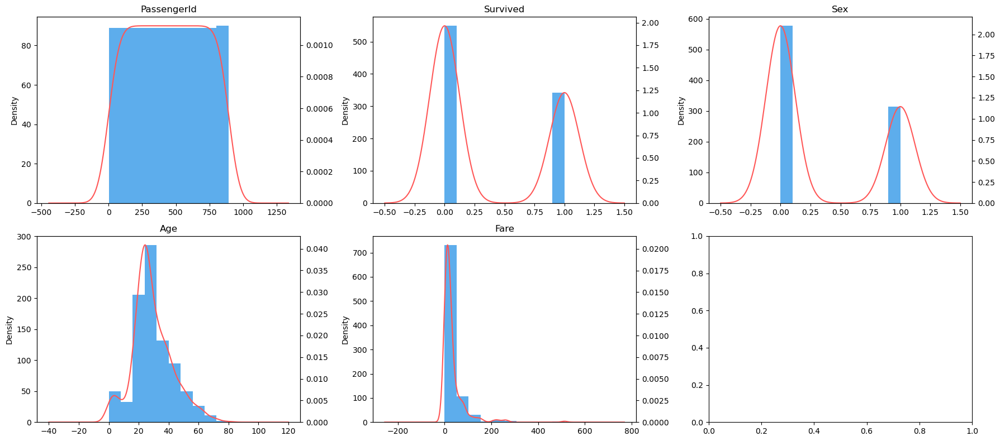

In [31]:
k = len(data_num.columns)
n = 3
m = (k - 1) // n + 1
fig, axes = plt.subplots(m, n, figsize=(n * 6, m * 4))
for i, (name, col) in enumerate(data_num.iteritems()):
    r, c = i // n, i % n
    ax = axes[r, c]
    col.hist(ax=ax, color='#5dadec')
    ax2 = col.plot.kde(ax=ax, secondary_y=True, title=name, color='#ff5757')
    ax2.set_ylim(0)

fig.tight_layout()

In [32]:
data_cat_unique = data_cat.nunique().reset_index()
data_cat_unique.columns = ['feature', 'unique value']
data_cat_unique = data_cat_unique.sort_values('unique value', ascending=False)
data_cat_unique

,feature,unique value
1,Name,891
3,relatives,9
0,Pclass,3
2,Embarked,3
4,travelled_alone,2


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

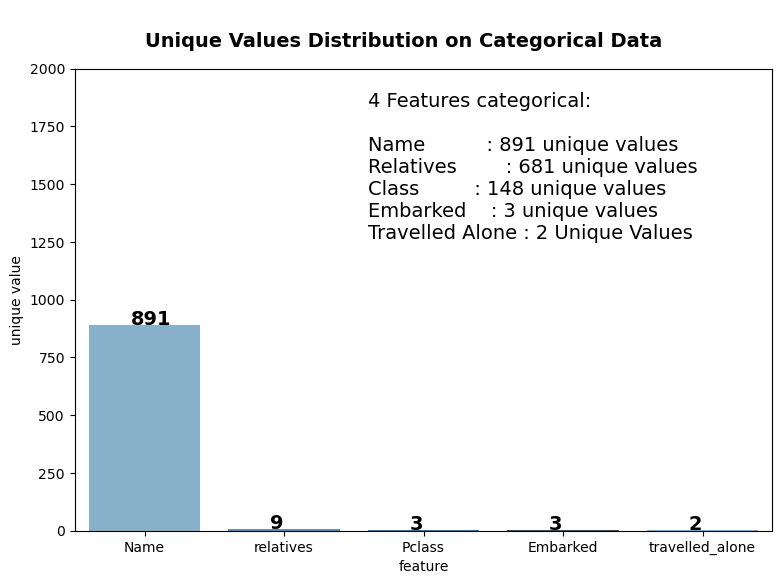

In [33]:
fig, ax = plt.subplots(figsize=(9,6))

g = sns.barplot(x = 'feature',y='unique value',data=data_cat_unique,ax=ax, 
               palette=sns.color_palette("Blues_d", n_colors=4, desat=1))

x = np.arange(len(data_cat_unique['feature']))
y = data_cat_unique['unique value']

for i, v in enumerate(y):
    ax.text(x[i]- 0.1, v+0.5, str(v), fontsize = 14, color='black', fontweight='bold')
    
title = '''
Unique Values Distribution on Categorical Data
'''
ax.text(0,2000,title,horizontalalignment='left',color='black',fontsize=14,fontweight='bold')
    

text = '''
4 Features categorical:

Name          : 891 unique values
Relatives        : 681 unique values
Class         : 148 unique values
Embarked    : 3 unique values
Travelled Alone : 2 Unique Values
 

''' 
ax.text(1.6,980,text,horizontalalignment='left',color='black',fontsize=14,fontweight='normal')
    
ax.set_ylim(0,2000)

ax.set_xticklabels(ax.get_xticklabels(),rotation=0)
plt.tight_layout

**known. there were 891 passengers from 681 tickets, a difference of 210 people or 23% of tickets registered, there were 9 types of passengers' relatives, 3 Social Economy Classes (Pclass), Passengers Boarded at 3 different locations, and classification of passengers traveling alone or with relatives**

<AxesSubplot:>

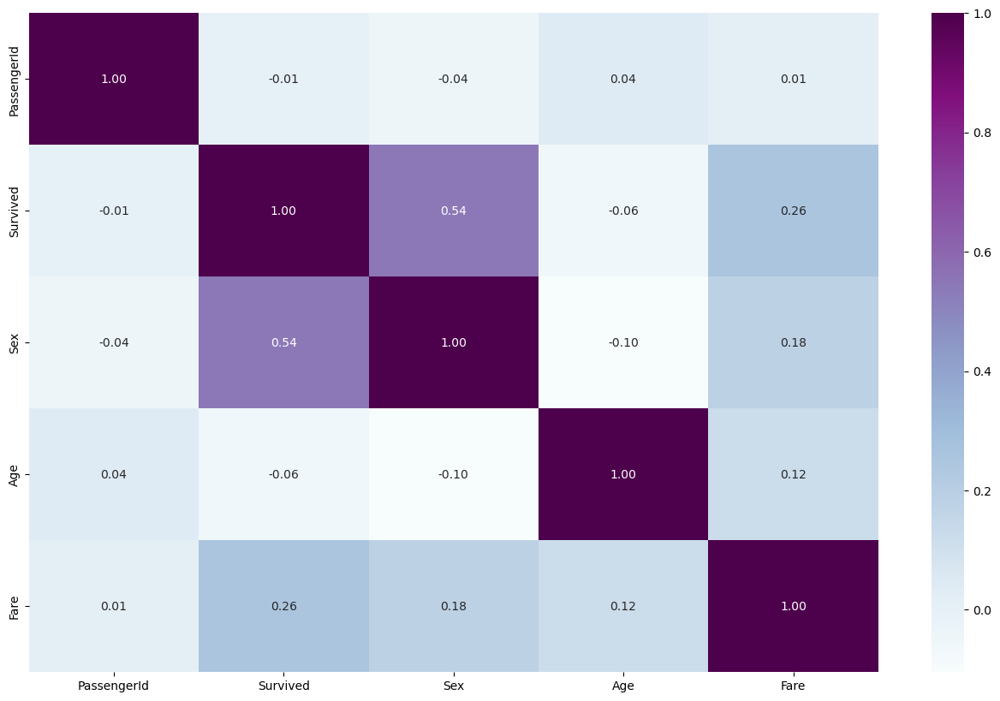

In [34]:
corr_= train_data.corr()
plt.figure(figsize=(16,10))
sns.heatmap(corr_, annot=True, fmt = ".2f", cmap = "BuPu")

From Correlation Graph above, we know:
- from the amount of "fare" has a 26% effect on "Survived"
- 41% of passengers are related, judging by "SibSp" and "Parch"
- and "Sex" correlates heavily with "Survived". amounts 54% 

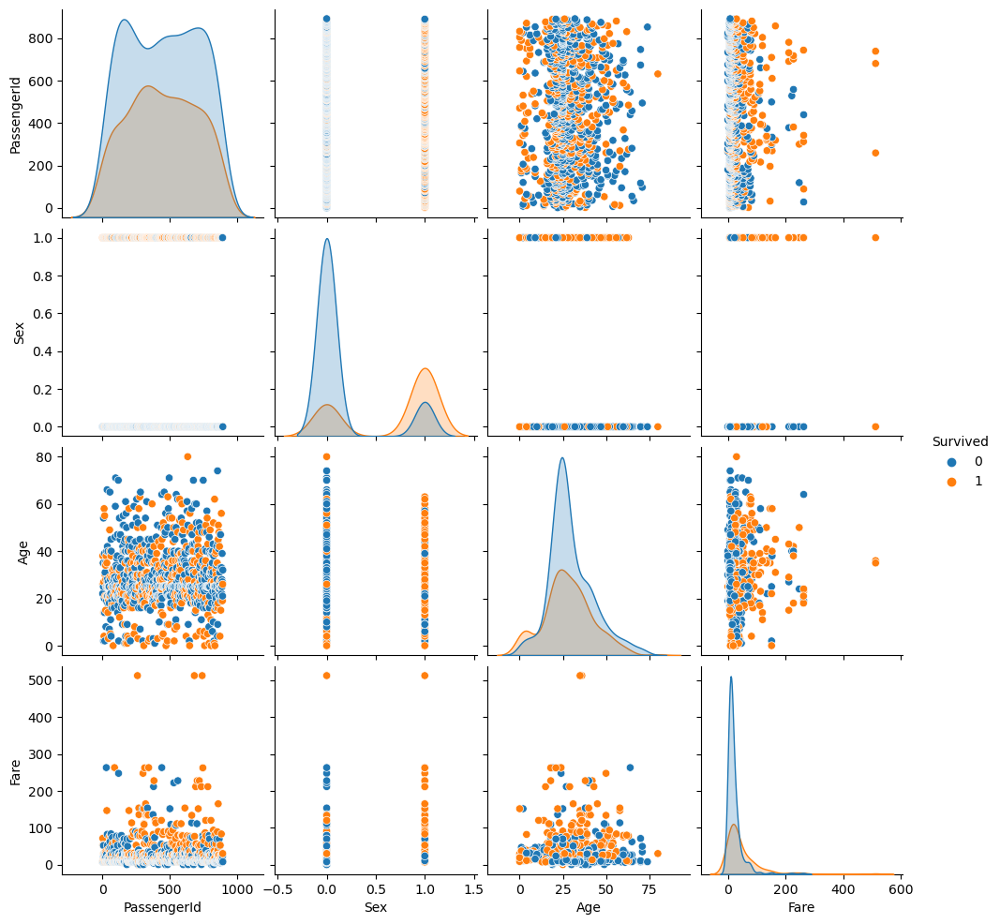

In [35]:
sns.pairplot(train_data, hue='Survived')

from the plot graph above, we can see the pattern of all the Titanic datasets

**Using Plotly Scatter 3D with Variable 'Name', 'Sex', and 'Age' to knowing all Passenger in Titanic**

In [36]:
fig = px.scatter_3d(train_data, x='Name', y='Sex', z='Age',
                    color='Age')
fig.show()

From this graph, we can find out all the passengers on the Titanic. by name, age, and gender

**Using Scatter Plotly to know Survive Passenger by Age**

In [37]:
for template in ["plotly"]:
    fig = px.scatter(train_data,
                     x="PassengerId", y="Age", color="Survived",
                     log_x=True, size_max=20,
                     template=template, title="Survived by Age?")
    fig.show()

From this graph, we can find all the passengers on the Titanic. based on ID, age, and whether they Survived or not Survived

----------------------------------

### 2.2.2 Characteristic

**1. Age and Gender**

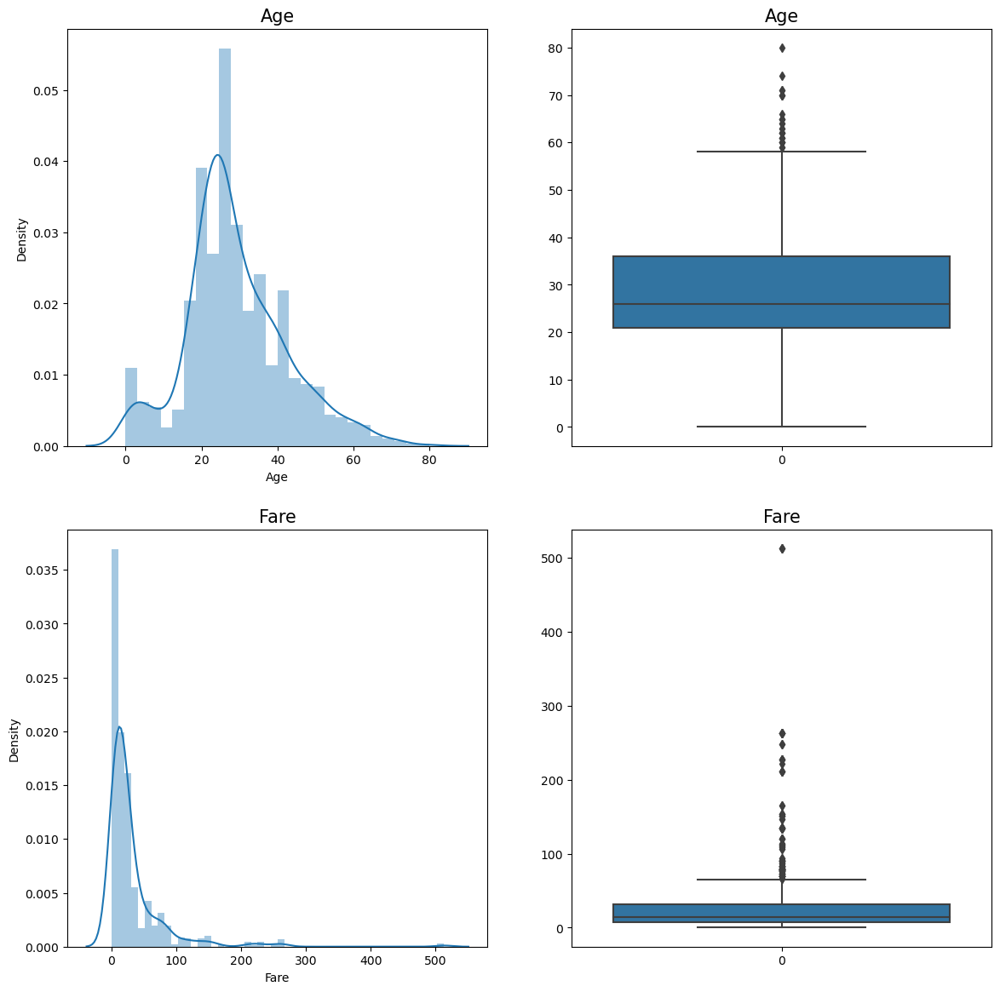

In [38]:
# Analyzing continuous variables
fig, axes = plt.subplots(nrows=2,ncols=2)
fig.set_size_inches(14, 14)
a = sns.distplot(train_data['Age'] , ax=axes[0][0])
a.set_title("Age",fontsize=15)
a = sns.boxplot(train_data['Age'] , orient = "v" , ax=axes[0][1])
a.set_title("Age",fontsize=15)

a = sns.distplot(train_data['Fare'] , ax=axes[1][0])
a.set_title("Fare",fontsize=15)
a = sns.boxplot(train_data['Fare'] , orient = "v" , ax=axes[1][1])
a.set_title("Fare",fontsize=15)
plt.show()

plt.show()

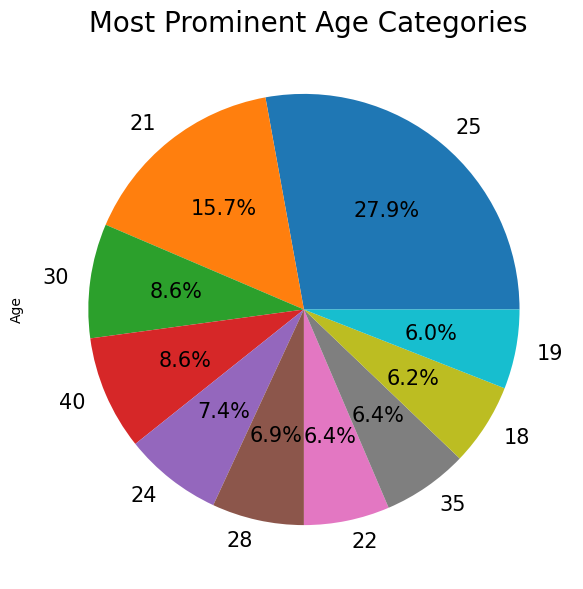

In [39]:
plt.figure(figsize=(7,7))
df = train_data.Age.value_counts().to_frame()
textprops = {"fontsize":15}
df.head(10).Age.plot(kind='pie',autopct='%1.1f%%',textprops =textprops )

plt.title(" Most Prominent Age Categories",fontsize = 20)
plt.show()

The most prominent age category for Titanic Passengers was 25 years old with a dominance of 27.9% and 21 years with a dominance of 15.7%.

In [40]:
pd.crosstab(train_data['Sex'],train_data['Survived'])

Survived,0,1
Sex,,
0,468,109
1,81,233


Text(0.5, 1.0, ' Characteristic Gender who survive Titanic Disaster')

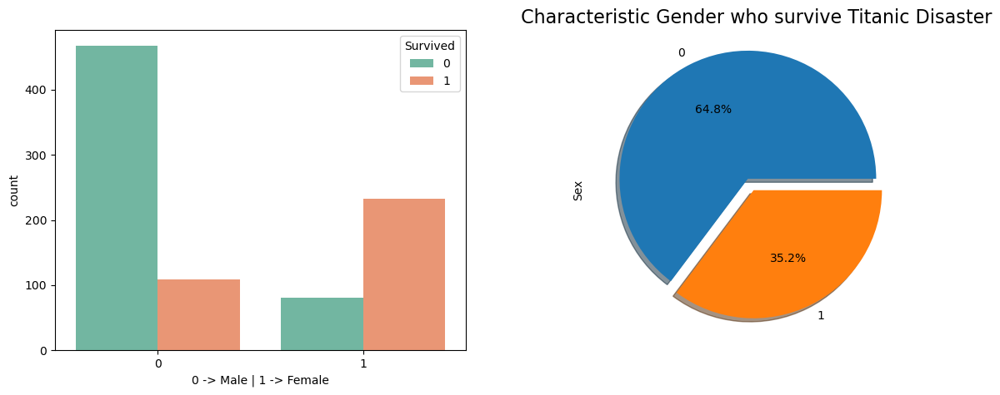

In [41]:
fig,ax=plt.subplots(1,2,figsize=(14,5))
graph = sns.countplot(x='Sex',data=train_data,hue='Survived',palette='Set2',ax=ax[0])
ax[0].set_xlabel("0 -> Male | 1 -> Female")
train_data.Sex.value_counts().plot.pie(ax=ax[1],autopct='%1.1f%%',shadow=True, explode=[0.1,0])
ax[1].set_title("0 -> Male | 1 -> Female")

for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
                    ha='center', va='bottom',
                    color= 'white')
        
plt.title(" Characteristic Gender who survive Titanic Disaster",fontsize = 16)

The comparison of the graph above shows. Men dominated the list of Titanic passengers at 64.8% but more than 468 men did not survive and just only 109 men Survived, while women only 35.2% of all passengers and also more than 233 women survived and 81 women not survived on Titanic disaster

**2. Class (Pclass)**

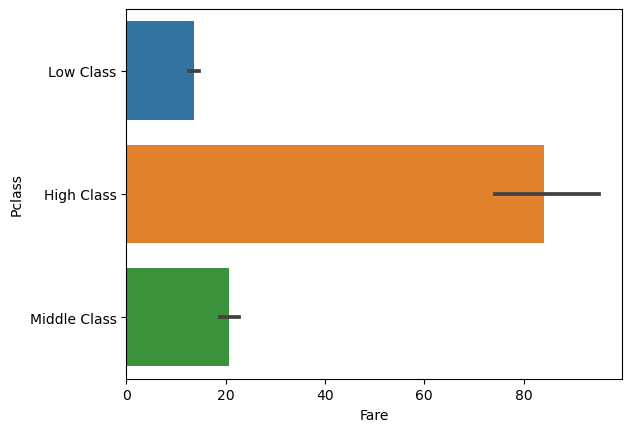

In [42]:
sns.barplot(y='Pclass', x='Fare', data=train_data);
for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

The Majority of Passenger on Titanic have High-Class Profile between data men and women, and High-Class Passenger has a fare more than 20 Pounds

In [43]:
pd.crosstab(train_data['Pclass'],train_data['Survived'])

Survived,0,1
Pclass,,
High Class,80,136
Low Class,372,119
Middle Class,97,87


Text(0.5, 1.0, ' Characteristic Social Class who survive Titanic Disaster')

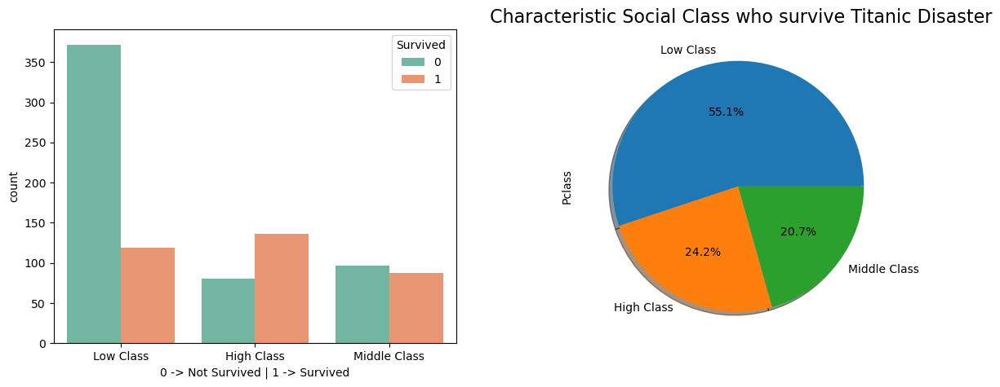

In [44]:
fig,ax=plt.subplots(1,2,figsize=(14,5))
graph = sns.countplot(x='Pclass',data=train_data,hue='Survived',palette='Set2',ax=ax[0])
ax[0].set_xlabel("0 -> Not Survived | 1 -> Survived")
train_data.Pclass.value_counts().plot.pie(ax=ax[1],autopct='%1.1f%%',shadow=True)
ax[1].set_title("0 -> Not Survived | 1 -> Survived")

for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
                    ha='center', va='bottom',
                    color= 'white')
        
plt.title(" Characteristic Social Class who survive Titanic Disaster",fontsize = 16)

High Class Passenger have more Chance to Survived the Titanic Disaster, 136 people has survived,followed by Passenger-Low class as many as 119 people, and 87 people from Passenger-Middle class

**3. Embarked**

In [45]:
pd.crosstab(train_data['Embarked'],train_data['Survived'])

Survived,0,1
Embarked,,
C,75,93
Q,47,30
S,427,219


Text(0.5, 1.0, ' Characteristic Embarked by Gender ')

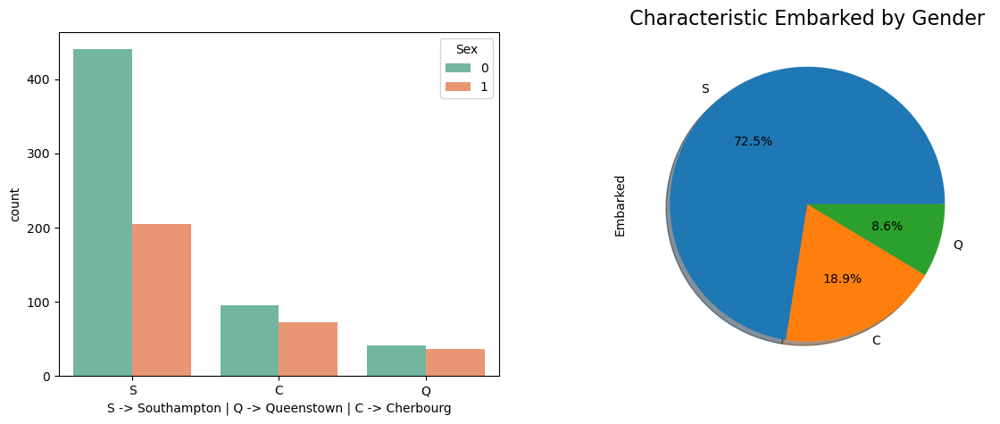

In [46]:
fig,ax=plt.subplots(1,2,figsize=(14,5))
graph = sns.countplot(x='Embarked',data=train_data,hue='Sex',palette='Set2',ax=ax[0])
ax[0].set_xlabel("S -> Southampton | Q -> Queenstown | C -> Cherbourg")
train_data.Embarked.value_counts().plot.pie(ax=ax[1],autopct='%1.1f%%',shadow=True)
ax[1].set_title("S -> Southampton | Q -> Queenstown | C -> Cherbourg")

for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
                    ha='center', va='bottom',
                    color= 'white')
        
plt.title(" Characteristic Embarked by Gender ",fontsize = 16)

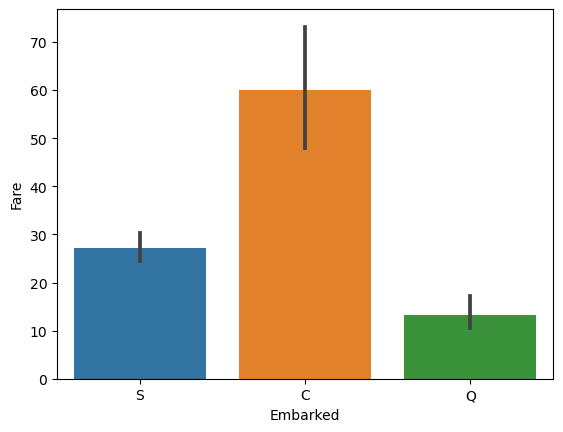

In [47]:
sns.barplot(y='Fare', x='Embarked', data=train_data);
for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

All Titanic passengers were dominated by passengers departing from Southampton, which was 72.5%, however, passengers departing from Cherbourg paid higher fares than passengers departing from Queenstown and Southampton. More passengers embarking from Southampton survived (219 peoples), compared to Cherbourg (93 Peoples) and Queenstown (30 Peoples)

**4. Fare**

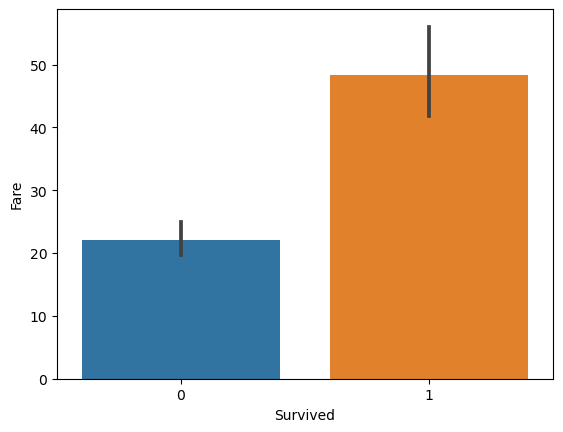

In [48]:
sns.barplot(y='Fare', x='Survived', data=train_data);
for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

a Passenger who Survived from Titanic disaster the passenger who pay fare more than 20 pounds

**5. Survived**

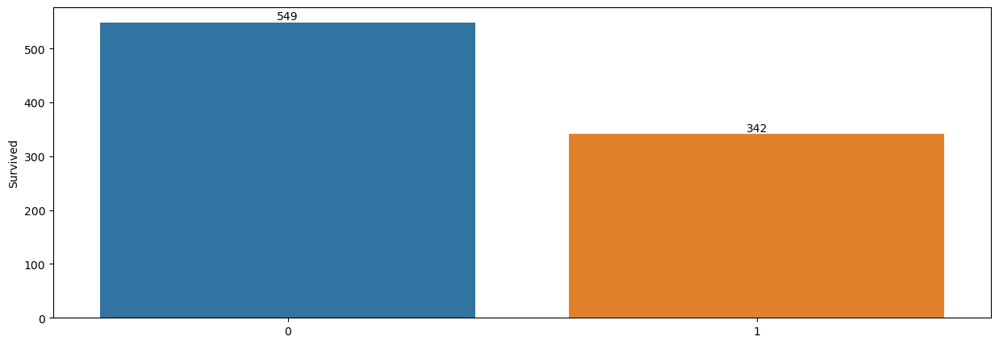

In [49]:
labels= train_data['Survived'].value_counts()[:5].keys()
values= train_data['Survived'].value_counts()[:5]

plt.figure(figsize = (15, 5))
graph = sns.barplot(x = labels, y = values, order=train_data['Sex'].value_counts().iloc[:5].index)

for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
                    ha='center', va='bottom',
                    color= 'black')

Text(0.5, 1.0, ' Characteristic Embarked by Gender ')

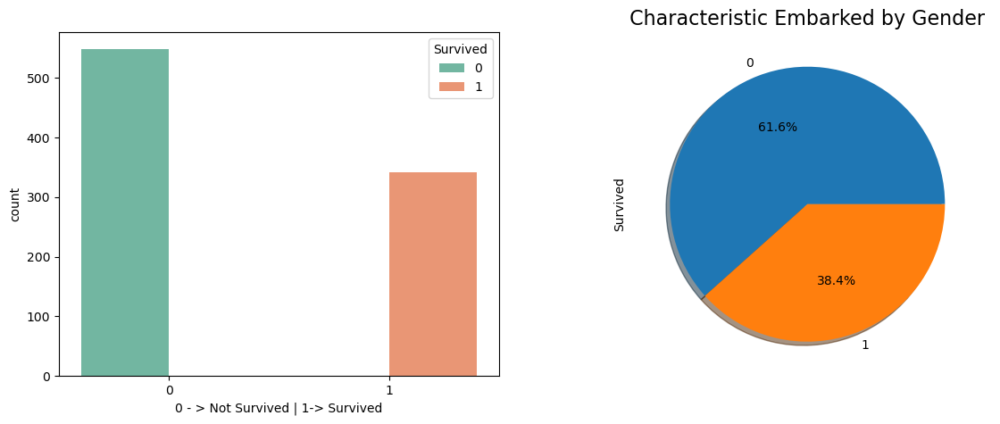

In [50]:
fig,ax=plt.subplots(1,2,figsize=(14,5))
graph = sns.countplot(x='Survived',data=train_data,hue='Survived',palette='Set2',ax=ax[0])
ax[0].set_xlabel("0 - > Not Survived | 1-> Survived")
train_data.Survived.value_counts().plot.pie(ax=ax[1],autopct='%1.1f%%',shadow=True)
ax[1].set_title("0 - > Not Survived | 1-> Survived")

for p in graph.patches:
        graph.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
                    ha='center', va='bottom',
                    color= 'white')
        
plt.title(" Characteristic Embarked by Gender ",fontsize = 16)

In [51]:
Survived = train_data[train_data['Survived']==1]

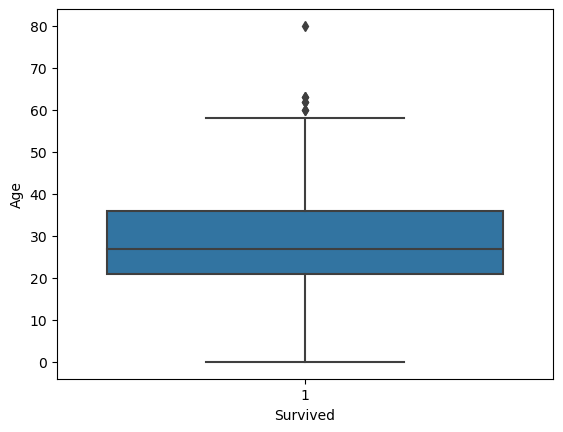

In [52]:
sns.boxplot(y='Age', x='Survived', data=Survived);

Of all the passengers who survived, only 342 people (38.4%) and 549 people (61.6%) did not survive. and the age range of Surviving passengers in the age range of 21 - 35 years

-----------------------

## 2.3 Data Pre-Processing

We checking again about dataset, Checking missing values and duplicate data to prepare processing with machine learning models

### 2.3.1 Missing Value

In [53]:
train_data.isnull().sum()

PassengerId        0
Survived           0
Pclass             0
Name               0
Sex                0
Age                0
Fare               0
Embarked           0
relatives          0
travelled_alone    0
dtype: int64

In [54]:
test_data.isnull().sum()

PassengerId        0
Pclass             0
Name               0
Sex                0
Age                0
Fare               0
Embarked           0
relatives          0
travelled_alone    0
dtype: int64

### 2.3.2 Duplicated Data

In [55]:
if train_data.duplicated().sum() == 0:
    print('There is no duplicated data')
else:
    print('There are duplicated data: ', train_data.duplicated().sum())

There is no duplicated data


Results above, in the data set there is no null values and duplicate data

## 2.4 Feature Engineering


In Feature Encoding, we coded categorical variables with ***One Hot Encoding*** to make machine learning formulations apply the best accuracy

and, the column features that we do one hot encoding are ***Pclass, Embarked, Travel Alone***.

### 2.4.1 One Hot Encoding

In [56]:
train_data['Pclass'] = train_data['Pclass'].fillna(train_data['Pclass'].mode()[0])
dummies_Pclass = pd.get_dummies(train_data['Pclass'],prefix='Pclass')
train_data = pd.concat([train_data, dummies_Pclass], axis=1)

train_data['Embarked'] = train_data['Embarked'].fillna(train_data['Embarked'].mode()[0])
dummies_Embarked = pd.get_dummies(train_data['Embarked'],prefix='Embarked')
train_data = pd.concat([train_data, dummies_Embarked], axis=1)

train_data['travelled_alone'] = train_data['travelled_alone'].fillna(train_data['travelled_alone'].mode()[0])
dummies_travel = pd.get_dummies(train_data['travelled_alone'],prefix='travelled_alone')
train_data = pd.concat([train_data, dummies_travel], axis=1)

In [57]:
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PassengerId          891 non-null    int64  
 1   Survived             891 non-null    int64  
 2   Pclass               891 non-null    object 
 3   Name                 891 non-null    object 
 4   Sex                  891 non-null    int64  
 5   Age                  891 non-null    int64  
 6   Fare                 891 non-null    float64
 7   Embarked             891 non-null    object 
 8   relatives            891 non-null    object 
 9   travelled_alone      891 non-null    object 
 10  Pclass_High Class    891 non-null    uint8  
 11  Pclass_Low Class     891 non-null    uint8  
 12  Pclass_Middle Class  891 non-null    uint8  
 13  Embarked_C           891 non-null    uint8  
 14  Embarked_Q           891 non-null    uint8  
 15  Embarked_S           891 non-null    uin

,PassengerId,Survived,Pclass,Name,Sex,Age,Fare,Embarked,relatives,travelled_alone,Pclass_High Class,Pclass_Low Class,Pclass_Middle Class,Embarked_C,Embarked_Q,Embarked_S,travelled_alone_No,travelled_alone_Yes
0,1,0,Low Class,"Braund, Mr. Owen Harris",0,22,7.2500,S,brothers,No,0,1,0,0,0,1,1,0
1,2,1,High Class,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,38,71.2833,C,brothers,No,1,0,0,1,0,0,1,0
2,3,1,Low Class,"Heikkinen, Miss. Laina",1,26,7.9250,S,Travel Alone,Yes,0,1,0,0,0,1,0,1
3,4,1,High Class,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,35,53.1000,S,brothers,No,1,0,0,0,0,1,1,0
4,5,0,Low Class,"Allen, Mr. William Henry",0,35,8.0500,S,Travel Alone,Yes,0,1,0,0,0,1,0,1


### 2.4.2 Feature Selection

Removed some unnecessary features, Unnecessary feature in dataset is Pclass, Name, Fare, Embarked, relatives, and travelled alone

In [58]:
train_data.drop(['Pclass','Name','Fare', 'Embarked', 'relatives', 'travelled_alone'], axis=1,inplace=True)
train_data.head(5)

,PassengerId,Survived,Sex,Age,Pclass_High Class,Pclass_Low Class,Pclass_Middle Class,Embarked_C,Embarked_Q,Embarked_S,travelled_alone_No,travelled_alone_Yes
0,1,0,0,22,0,1,0,0,0,1,1,0
1,2,1,1,38,1,0,0,1,0,0,1,0
2,3,1,1,26,0,1,0,0,0,1,0,1
3,4,1,1,35,1,0,0,0,0,1,1,0
4,5,0,0,35,0,1,0,0,0,1,0,1


In [59]:
train_data.shape, train_data.columns

((891, 12),
 Index(['PassengerId', 'Survived', 'Sex', 'Age', 'Pclass_High Class',
        'Pclass_Low Class', 'Pclass_Middle Class', 'Embarked_C', 'Embarked_Q',
        'Embarked_S', 'travelled_alone_No', 'travelled_alone_Yes'],
       dtype='object'))

In [60]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   PassengerId          891 non-null    int64
 1   Survived             891 non-null    int64
 2   Sex                  891 non-null    int64
 3   Age                  891 non-null    int64
 4   Pclass_High Class    891 non-null    uint8
 5   Pclass_Low Class     891 non-null    uint8
 6   Pclass_Middle Class  891 non-null    uint8
 7   Embarked_C           891 non-null    uint8
 8   Embarked_Q           891 non-null    uint8
 9   Embarked_S           891 non-null    uint8
 10  travelled_alone_No   891 non-null    uint8
 11  travelled_alone_Yes  891 non-null    uint8
dtypes: int64(4), uint8(8)
memory usage: 34.9 KB


--------------------------

# 3. Modelling

## 3.1 Train test split


In [61]:
Modelling_Train = train_data.iloc[:891,]
Modelling_Test = train_data.iloc[891:,]

In [62]:
Modelling_Train.shape, Modelling_Test.shape

((891, 12), (0, 12))

***Splitting the dataset into train and test datasets, 70% Train Data + 30% Test Data***

In [63]:
X = Modelling_Train.drop(['Survived'],axis=1)
y = Modelling_Test['Survived']
              
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(train_data.drop('Survived', 1), train_data['Survived'], test_size = .3)

----------------------------------

## 3.2 Machine Learning Model


Model Machine Learning using ****Logistic Regression ,K-Nearest Neighbors , Support Vector Classifier, Naive Bayes, Desicion Tree, and Random Foresst**** to formulation the Machine learning modelling scores to fit with Titanic Passenger Data

In [64]:
#Import Modelling Modul
import scipy.stats as stats
from sklearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,roc_auc_score
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV,train_test_split,cross_val_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from scipy.stats import randint
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [65]:
import sklearn.metrics as metrics
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score


def models(models):
  results = pd.DataFrame({'accuracy_train':[],'accuracy_test':[],
                          'recall_train':[], 'recall_test':[],
                          'precision_train':[],'precision_test':[],
                          'AUC_train': [], 'AUC_test': [], 
                          'f1_score_train':[], 'f1_score_test':[]})
  

  for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    #fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
    #auc_score_train = auc(fpr, tpr)
    results = results.append({'accuracy_train': accuracy_score(y_train, model.predict(X_train)),
                              'accuracy_test': accuracy_score(y_test, model.predict(X_test)),
                              'recall_train': recall_score(y_train, model.predict(X_train), average='macro'),
                              'recall_test': recall_score(y_test, model.predict(X_test), average='macro'),
                              'precision_train': precision_score(y_train, model.predict(X_train), average='macro'),
                              'precision_test': precision_score(y_test, model.predict(X_test), average='macro'),
                              'AUC_train': roc_auc_score(y_train, model.predict(X_train)),
                              'AUC_test': roc_auc_score(y_test, model.predict(X_test)),
                              'f1_score_train': metrics.f1_score(y_train, model.predict(X_train)),
                              'f1_score_test':  metrics.f1_score(y_test, model.predict(X_test))
                              }, ignore_index=True)
    

   
  
  results['model'] = ['Logistic Regression', 'KNN','SVM','Naive Bayes', 'Decision Tree', 'Random Forest']
  return results

In [66]:
models([LogisticRegression(), KNeighborsClassifier(), SVC(),GaussianNB(), DecisionTreeClassifier(), RandomForestClassifier()])

,accuracy_train,accuracy_test,recall_train,recall_test,precision_train,precision_test,AUC_train,AUC_test,f1_score_train,f1_score_test,model
0,0.788122,0.835821,0.768259,0.809569,0.779132,0.835680,0.768259,0.809569,0.713043,0.763441,Logistic Regression
1,0.695024,0.518657,0.659414,0.455297,0.677865,0.444559,0.659414,0.455297,0.560185,0.236686,KNN
2,0.613162,0.623134,0.500000,0.500000,0.306581,0.311567,0.500000,0.500000,0.000000,0.000000,SVM
3,0.733547,0.798507,0.722991,0.777672,0.719862,0.787773,0.722991,0.777672,0.662602,0.721649,Naive Bayes
4,1.000000,0.708955,1.000000,0.697990,1.000000,0.692689,1.000000,0.697990,1.000000,0.628571,Decision Tree
5,1.000000,0.794776,1.000000,0.766852,1.000000,0.787567,1.000000,0.766852,1.000000,0.705882,Random Forest


the machine learning model with ***Random Forest and Decision Tree Algorithm***  had a perfect score train/test score. For further evaluation, the researcher used the ***Random Forest*** model to advance evaluation, with train accuracy 100 %, test accuracy 79%, precision train and test 100% / 76%, AUC train 100%, AUC test 76%, F1 Score train and test have 100% and 71%

------------------------------

# 4. Evaluation

In [67]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

## 4.1 Cross Validation

In [68]:
scores = cross_val_score(rf, X_train, y_train, cv=5)
print('Cross-Validation Accuracy Scores', scores)
print('Cross-Validation Accuracy Scores', scores.mean())

Cross-Validation Accuracy Scores [0.72       0.808      0.8        0.73387097 0.7983871 ]
Cross-Validation Accuracy Scores 0.7720516129032259


***Cross-Validation Accuracy Scores is 0.7848 or 78.5%***

## 4.2 Hyperparameter Tuning

In [69]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
import numpy as np
%timeit

param_grid = [
{'criterion':['gini', 'entropy'],'n_estimators': [25, 50, 100], 'max_features': ['auto', 'log2'], 
'max_depth': [25, 50, 100],
'min_samples_split':[2, 5, 10], 'min_samples_leaf':[4, 8, 16], 'bootstrap': [True, False]}
 ]

rf = RandomForestClassifier(random_state=42)

grid_search_forest = GridSearchCV(rf, param_grid, cv=5)
grid_search_forest.fit(X_train, y_train)

grid_search_forest.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=25, min_samples_leaf=8,
                       n_estimators=50, random_state=42)

In [70]:
rf = RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=25,
                       min_samples_leaf=16, n_estimators=50, random_state=42)
rf.fit(X_train,y_train)
rf_predicted = rf.predict(X_test)
rf_conf_matrix = confusion_matrix(y_test, rf_predicted)
rf_acc_score = accuracy_score(y_test, rf_predicted)

print("confussion matrix")
print(rf_conf_matrix)
print("\n")
print("Accuracy of Random Forest:",rf_acc_score*100,'\n')
print(classification_report(y_test,rf_predicted))

confussion matrix
[[161   6]
 [ 36  65]]


Accuracy of Random Forest: 84.32835820895522 

              precision    recall  f1-score   support

           0       0.82      0.96      0.88       167
           1       0.92      0.64      0.76       101

    accuracy                           0.84       268
   macro avg       0.87      0.80      0.82       268
weighted avg       0.85      0.84      0.84       268



After Hyperparameter tuning accuracy value of  ***Random Forest*** Algorithm is 81%*, with precision 0.83 / 0.76, recall 0.89/0.65, f1-score 0.86/0.70 and support 176/92

-----------------------------------

## 4.3 Feature Importance

Text(0.5, 1.0, 'feature importance score')

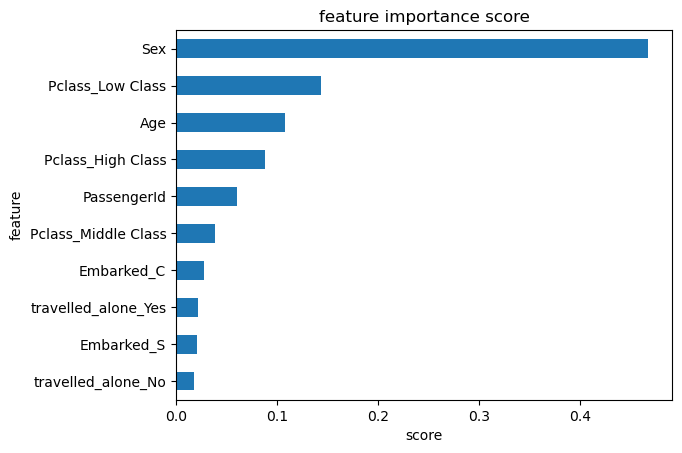

In [71]:
feat_importances = pd.Series(rf.feature_importances_, index=X.columns)
ax = feat_importances.nlargest(10).plot(kind='barh')
ax.invert_yaxis()
plt.xlabel('score')
plt.ylabel('feature')
plt.title('feature importance score')

Feature Importance that influent passengers can survive the Titanic Disaster, including:
- Sex / Gender
- Pclass - Low 
- Age
- Pclass - Low 
- Pclass - Mid 

--------------------------------

## 4.4 Permutation Importance

In [72]:
import eli5 
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(grid_search_forest.best_estimator_, random_state=42).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X.columns.to_list())

Weight,Feature
0.2075 ± 0.0219,Sex
0.0246 ± 0.0154,Pclass_Low Class
0.0194 ± 0.0087,Age
0.0075 ± 0.0157,travelled_alone_Yes
0.0030 ± 0.0119,travelled_alone_No
0.0000 ± 0.0047,Embarked_S
0 ± 0.0000,Embarked_Q
-0.0015 ± 0.0090,Pclass_Middle Class
-0.0037 ± 0.0177,Pclass_High Class
-0.0052 ± 0.0076,Embarked_C


The table above is an influential feature in the experiment that survived Titanic Disaster, including:
- Sex / Gender
- PClass
- Age
- Travelled Alone

## 4.5 Random Forest Tree Classifier

In [73]:
from sklearn.tree import export_graphviz
estimator = grid_search_forest.best_estimator_[5]
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X.columns,
                class_names = ['no Survived','Survived'],
                rounded = True, proportion = False, 
                precision = 3, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

---------------------------------

## 4.6 SHAP (Shapley Additive explanation)

SHAP is for gaining insight from our Machine Learning model. If the above algorithm talks in full how each feature affects the performance of the model, SHAP is more specific in taking into account how each specific feature affects each prediction made.

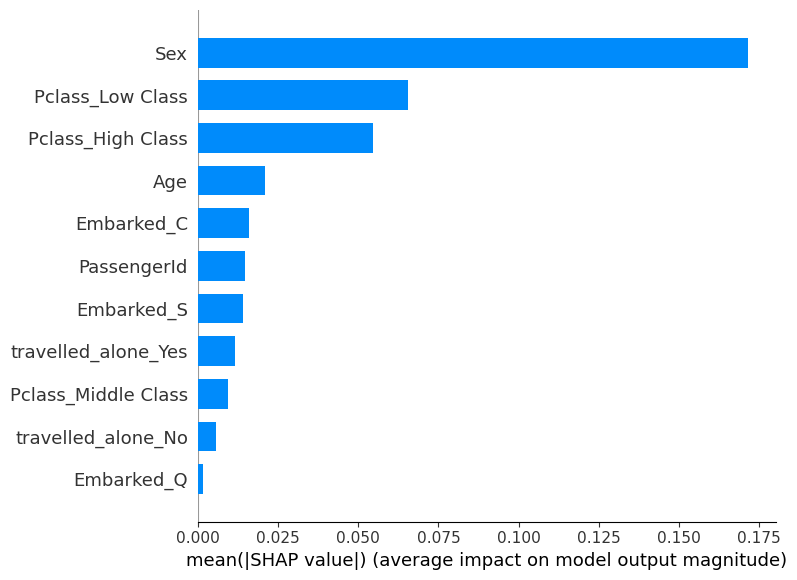

In [74]:
import shap 
feature_names = X.columns.values.tolist()
X_test_df = pd.DataFrame(data=X_test, columns=feature_names)

explainer = shap.TreeExplainer(grid_search_forest.best_estimator_)
shap_values = explainer.shap_values(X_test_df)

shap.summary_plot(shap_values[1], X_test_df, plot_type="bar")

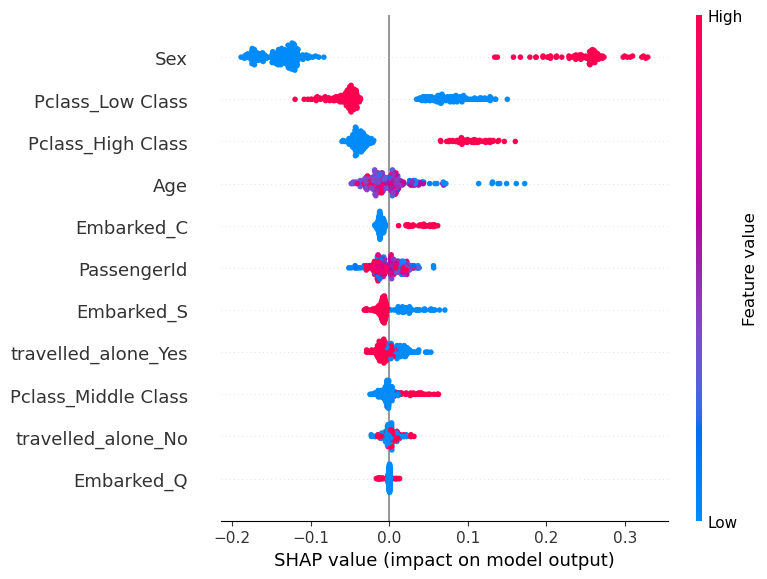

In [75]:
shap.summary_plot(shap_values[1], X_test_df)

As clearly seen in the above shap summary,

• Low value(blue on right) of Sex/Gender to higher probability that affect high death tolls on Titanic Disaster

• Same is for class of Passenger (Pclass) , High Class have chance to survive than Low Class and Middle Class.

• Age has a High Variance in the data set as seen from the chart above





Let's see how different variables affect prediction for individual passenger

In [76]:
def plot_shap(model, passenger):

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(passenger)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], shap_values[1], passenger)

In [77]:
passenger = X_test_df.iloc[1,:].astype(float)
plot_shap(grid_search_forest.best_estimator_, passenger)

In [78]:
passenger = X_test_df.iloc[2,:].astype(float)
plot_shap(grid_search_forest.best_estimator_, passenger)

In [79]:
passenger = X_test_df.iloc[5,:].astype(float)
plot_shap(grid_search_forest.best_estimator_, passenger)

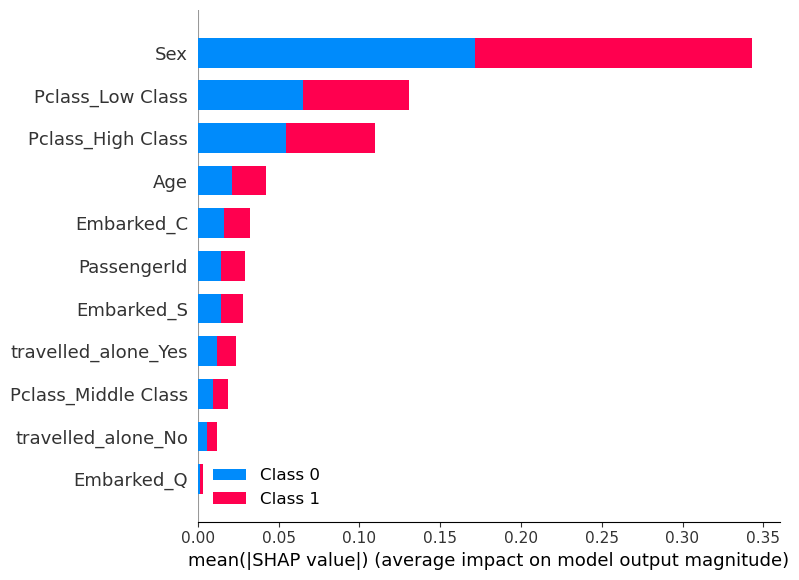

In [80]:
shap_val = explainer.shap_values(X_test)
shap.summary_plot(shap_val, X_test)

In the bar plot above, **Gender and Pclass** is the most contributing feature to distinguish a class. it is now clear that the **Gender and Pclass** led to a high death tolls the titanic disaster

### 4.6.1 SHAP Explainer

**Survived (Red)** vs **No Survived (Blue)** for 50 passenger

We can hover over the data below to get information for each passenger

In [81]:
shap_values = explainer.shap_values(X_train.iloc[:50])
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test_df.iloc[:50])

-------------------------------------

----------------------------------

# 5. Summary

The results of research conducted to predict heart disease and its causes. from the modeling carried out including *Logistic Regression, Naive Bayes, Support Vector Machine, K-Nearest Neighbors, Decision Tree and Random Forest*. The results of the modeling above show that ***Decision Tree and Random Forest*** have the most significant numbers of all the modeling algorithms carried out. Next, the authors carry out further evaluation using ***Random Forest*** for this study. because it is more suitable with the dataset in predicting and knowing the factor of Titanic Disaster from the existing data sample. By using the *Permutation Importance and SHAP* methods, it is known that from the entire sample it shows *****Gender and Pclass (Social Economic Class)***** which are factors that influence the high death toll in the Titanic disaster. there are likely other factors in the data set, which contributed to the high mortality. it can be from nature, community knowledge, technology, and social aspects. we don't fully know what actually happened, we can only predict through machine learning and the probability is not absolute. this incident only the passengers and god knows, what and the causes and effects that occurred in the titanic disaster